In [168]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets
from sklearn.model_selection import train_test_split
from PIL import Image

In [169]:

# Custom dataset
class MRI_Dataset(Dataset):
    def __init__(self, images, titles, labels, transform=None):
        self.images = images
        self.titles = titles
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # Load and preprocess the data
        image = self.images[idx]
        title = self.titles[idx]
        label = self.labels[idx]
        
        #transformation
        if self.transform:
            image = self.transform(image)

        return image, title, label

In [170]:

def load_images_and_labels(folder_path, subjects_file_path):
    data = pd.read_csv(subjects_file_path, sep='\t')
    images = []
    titles = []
    labels = []

    for index, row in data.iterrows():
        image_filename = row['Subject'] 
        image_path = os.path.join(folder_path, f"{image_filename}.png")
        image = Image.open(image_path).convert('L')  # 'L' mode for grayscale
        
        label = row['Label']
        images.append(image)
        titles.append(image_filename)
        labels.append(label)

    return images, titles, labels

In [171]:
def get_data():
    parent_dir = os.path.dirname(os.getcwd())
    train_folder_path = os.path.join(parent_dir,"data", "train")
    train_subjects_file_path = os.path.join(train_folder_path, "subjects.tsv")
    X_train, X_train_titles, y_train = load_images_and_labels(train_folder_path, train_subjects_file_path)

    validation_folder_path = os.path.join(parent_dir,"data", "validation")
    validation_subjects_file_path = os.path.join(validation_folder_path, "subjects.tsv")
    X_validation, X_validation_titles, y_validation = load_images_and_labels(validation_folder_path, validation_subjects_file_path)

    return X_train, X_validation, X_train_titles, X_validation_titles, y_train, y_validation

In [179]:
# neural network model
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        # layers
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(p=0.5)
        self.fc = nn.Linear(32 * 60 * 60, 2)  # Output dimensions : (1, 2)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(x)
        x = self.fc(x)
        return x

In [173]:
# Second model (more complex)
class ClassifierCNN(nn.Module):
    def __init__(self):
        super(ClassifierCNN, self).__init__()

        self.cnn_layers = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.linear_layers = nn.Sequential(
            nn.Linear(32 * 30 * 30, 128),  # Adjust this size based on your CNN architecture
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(128, 2),
        )

    def forward(self, x):
        x = self.cnn_layers(x)
        x = x.view(x.size(0), -1)
        x = self.linear_layers(x)
        return x
  

In [174]:
def train_model(model, train_loader, validation_loader, num_epochs, lr):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_losses = []
    validation_losses = []
    train_accuracies=[]
    validation_accuracies=[]
    validation_results = []

    for epoch in range(num_epochs):
        model.train()

        train_loss = 0.0
        correct_train = 0
        total_train = 0

        for images, titles, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(images)
            #print(labels)
            #print(outputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)

            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()
        
        #print(total_train)
        #print(correct_train, total_train)
        accuracy_train = correct_train / total_train
        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        train_accuracies.append(accuracy_train)

        print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {avg_train_loss:.4f}, Training Accuracy: {accuracy_train}')

        # Validation
        model.eval()
        validation_loss = 0.0
        correct_validation = 0
        total_validation = 0

        with torch.no_grad():
            for images, titles, labels in validation_loader:
                outputs = model(images)
                loss = criterion(outputs, labels)
                validation_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1)
                total_validation += labels.size(0)

                correct_validation += (predicted == labels).sum().item()
                #print(labels)
                #print(predicted)
                
                if(epoch==(num_epochs-1)):
                        batch_results = {
                            'Subject': titles,
                            'Label': predicted
                        }
                        validation_results.append(batch_results)
                
        #print(len(validation_loader))
        accuracy_validation = correct_validation / total_validation
        avg_validation_loss = validation_loss / len(validation_loader)
        validation_losses.append(avg_validation_loss)
        validation_accuracies.append(accuracy_validation)

        print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_validation_loss:.4f}, Validation Accuracy: {accuracy_validation}')
        
        if(epoch==(num_epochs-1)):
            # Save validation results to output.tsv
            output_df = pd.DataFrame(columns=['Subject', 'Label'])

            for batch_result in validation_results:
                output_df = pd.concat([output_df, pd.DataFrame(batch_result)])

            output_df.to_csv('output.tsv', sep='\t', index=False)     

    return train_losses, validation_losses, train_accuracies, validation_accuracies

In [175]:
def plot_results(train_losses, val_losses, train_accuracies, val_accuracies, num_epochs):
    epochs = range(1, num_epochs + 1)

    # Plot Training Loss vs. Validation Loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Training Accuracy vs. Validation Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

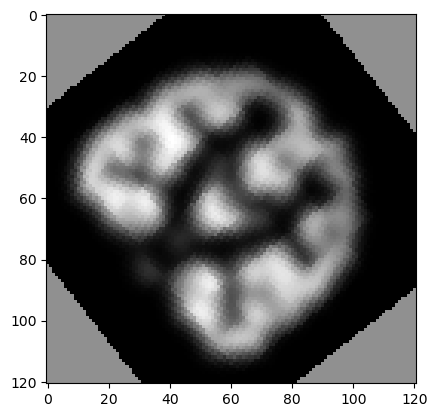

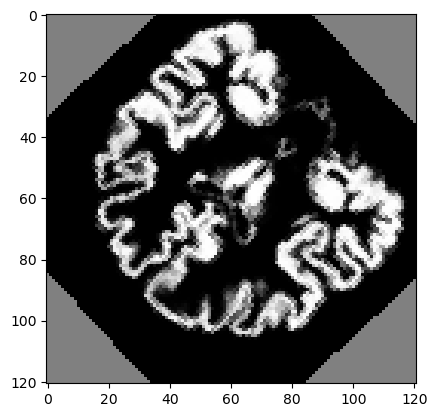

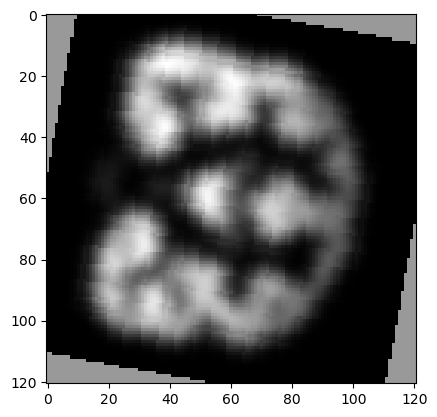

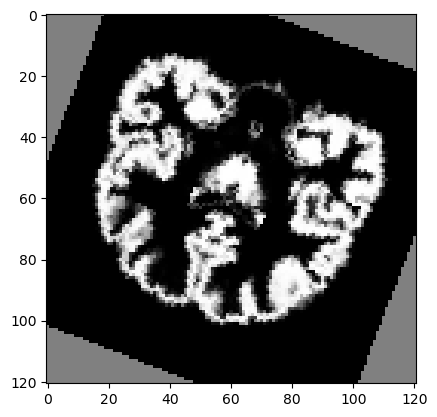

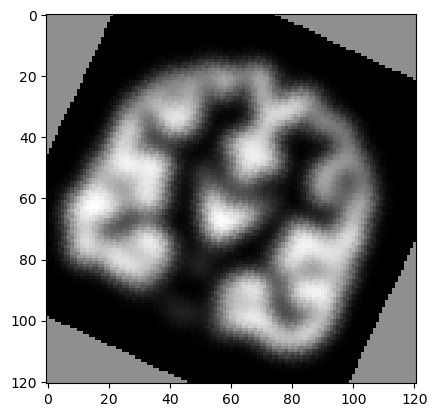

...

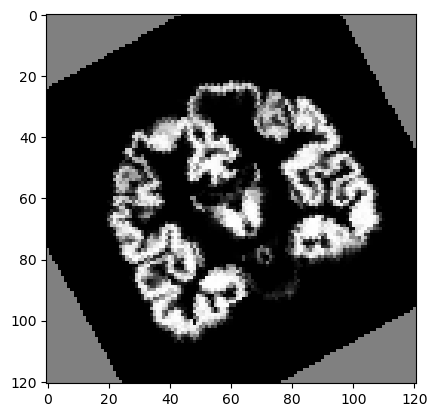

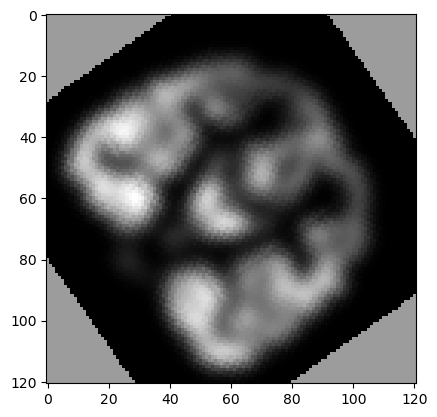

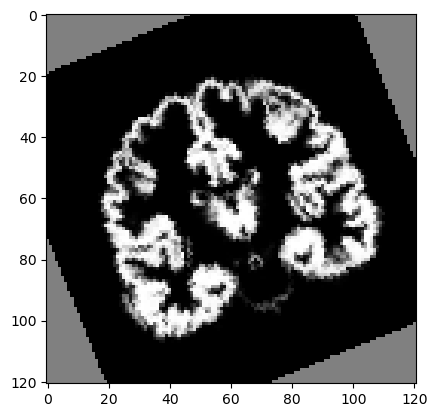

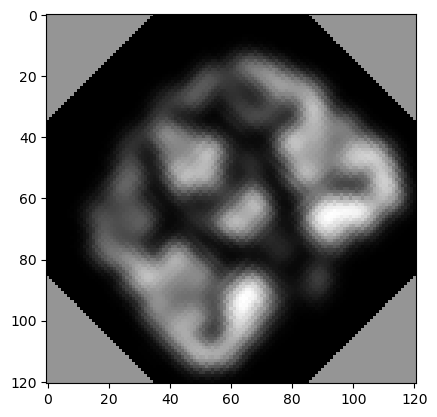

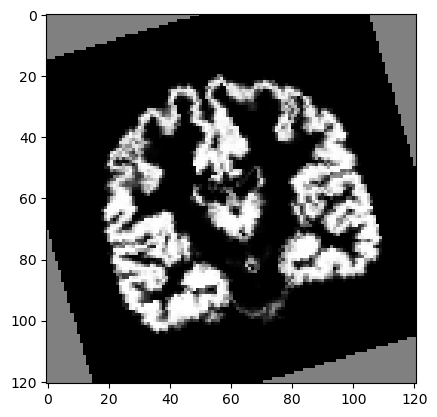

In [180]:
num_epochs = 5
batch_size = 40
learning_rate = 0.001

# Get data
X_train, X_test,X_train_titles, X_test_titles, y_train, y_test = get_data()

#print(len(X_train_titles))
#print(len(X_test_titles))

#transformations
transform = transforms.Compose([transforms.Grayscale(num_output_channels=1), 
                                transforms.ToTensor(),
                                transforms.RandomAffine(degrees=0, scale=(0.9, 1.1)),
                                transforms.Normalize((0.5,), (0.5,)),
                                transforms.RandomRotation(degrees=180),
                                transforms.RandomHorizontalFlip(),
                                transforms.RandomVerticalFlip(),
                                ])

# MRI datasets
train_dataset = MRI_Dataset(X_train, X_train_titles, y_train, transform=transform)
validation_dataset = MRI_Dataset(X_test, X_test_titles, y_test, transform=transform)

for image, title, label in train_dataset:
        image = image.squeeze().numpy()
        plt.imshow(image, cmap='gray') 
        plt.show()
    

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

model = SimpleCNN()

In [181]:
# Train the model
train_losses, validation_losses, train_accuracies, validation_accuracies =train_model(model, train_loader, validation_loader, num_epochs, learning_rate)
#print(b)

Epoch 1/5, Training Loss: 2.7104, Training Accuracy: 0.7375
Epoch 1/5, Validation Loss: 0.0120, Validation Accuracy: 1.0
Epoch 2/5, Training Loss: 0.0595, Training Accuracy: 0.985
Epoch 2/5, Validation Loss: 0.0000, Validation Accuracy: 1.0
Epoch 3/5, Training Loss: 0.0117, Training Accuracy: 0.995
Epoch 3/5, Validation Loss: 0.0000, Validation Accuracy: 1.0
Epoch 4/5, Training Loss: 0.0000, Training Accuracy: 1.0
Epoch 4/5, Validation Loss: 0.0000, Validation Accuracy: 1.0
Epoch 5/5, Training Loss: 0.0000, Training Accuracy: 1.0
Epoch 5/5, Validation Loss: 0.0000, Validation Accuracy: 1.0


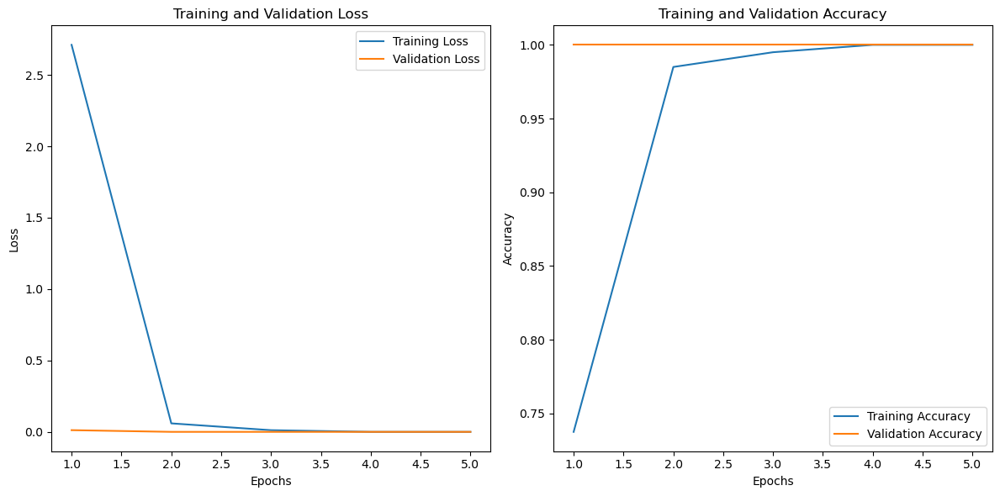

In [182]:
plot_results(train_losses, validation_losses, train_accuracies, validation_accuracies, num_epochs)

In [ ]:
# Show the image
#for image in X_test:
#        print(image)
#        plt.imshow(image, cmap='gray')  # 'gray' colormap for grayscale images
#        plt.show()

#for y in y_test:
#        print(y)